In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns

from visual_behavior_glm.glm import GLM
from visual_behavior_glm import GLM_visualization_tools as gvt

import sys
sys.path.append(os.path.split(os.getcwd())[0])
from utilities import helper_functions
import matplotlib.pyplot as plt

In [2]:
%matplotlib notebook

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
data_path = os.path.join('~/code/claustrum_imaging_manuscript/data')
session_list = pd.read_csv(os.path.join(os.path.join(data_path,'session_list.csv')))
active_sessions = session_list.query('session_type == "active"')
active_sessions

,mouse_id,sex,genotype,AP_coord,ML_coord,DV_coord,session_type,recording_date,processing_date
18,M332849,M,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai93(TITL-...,1.5,3.125,2.5,active,2018-06-14 12:44:33.658000,2018-07-26 12:11:01.983524799-07:00
19,M348126,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai94(TITL-...,1.5,2.625,2.5,active,2018-06-13 13:47:38.463000,2018-07-26 18:15:45.828682184-07:00
20,M351181,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai94(TITL-...,1.5,2.625,2.5,active,2018-03-14 14:32:15.328000,2018-07-26 18:59:36.293976068-07:00
21,M397408,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai93(TITL-...,1.5,2.625,2.5,active,2018-11-01 11:40:14.487000,2019-01-22 01:32:10.700291872-08:00


In [6]:
session_dict = {}
for idx,row in active_sessions.reset_index().iterrows():
    session_dict[row['mouse_id']] = helper_functions.load_session(
        row['mouse_id'], 
        session_type='active', 
        data_path = '/home/dougo/code/claustrum_imaging_manuscript/data'
    )
    print('on session {} of {}   '.format(idx+1,len(active_sessions)),end='\r')

In [7]:
glm_dict = {}
for mouse_id in session_dict.keys():
    session = helper_functions.AllenSDKExperiment(session_dict[mouse_id])

    glm_dict[mouse_id] = GLM(
        ophys_experiment_id = 'cla_active_{}'.format(mouse_id),
        version = 'claustrum_active',
        NO_DROPOUTS = False,
        TESTING = False,
        log_results=True, 
        log_weights=True,
        gft_import='current',
        use_previous_fit=False,
        session=session
    )

/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/glm.py:45: UserWarning: could not find ophys_experiment ID in LIMS
Execution failed on sql 'select ophys_session_id from ophys_experiments where id = cla_active_M332849': column "cla_active_m332849" does not exist
LINE 1: ...phys_session_id from ophys_experiments where id = cla_active...
                                                             ^

  warnings.warn('could not find ophys_experiment ID in LIMS\n{}'.format(e))


Fitting ophys_experiment_id: cla_active_M332849
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7


    Fitting L2, 0.1:   0%|          | 0/5 [00:00<?, ?it/s]

The following kernels failed to be added to the model: 
{'passive_change'}

The following dropouts failed to be added to the model: 
{'beh_model', 'single-pupil_and_omissions', 'single-passive_change', 'pupil_and_omissions', 'single-beh_model', 'expectation', 'single-expectation'}

Setting up CV
Evaluating Regularization values
Evaluating a grid of regularization values


    Fitting L2, 500.0: 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]


Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


    Fitting model, false_alarms:  20%|██        | 1/5 [00:10<00:41, 10.45s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, image6:  60%|██████    | 3/5 [00:31<00:21, 10.62s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, single-false_alarms:  20%|██        | 1/5 [00:09<00:39,  9.76s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, single-image6:  60%|██████    | 3/5 [00:30<00:20, 10.01s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Bootst

Starting diagnostics
Bootstrapping synthetic data


    Shuffling by cells:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
logging results to mongo
done logging results to mongo
logging W matrix to mongo
done logging W matrix to mongo
done building GLM object


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/glm.py:45: UserWarning: could not find ophys_experiment ID in LIMS
Execution failed on sql 'select ophys_session_id from ophys_experiments where id = cla_active_M348126': column "cla_active_m348126" does not exist
LINE 1: ...phys_session_id from ophys_experiments where id = cla_active...
                                                             ^

  warnings.warn('could not find ophys_experiment ID in LIMS\n{}'.format(e))


Fitting ophys_experiment_id: cla_active_M348126
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions


    Fitting L2, 0.1:   0%|          | 0/5 [00:00<?, ?it/s]

    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels failed to be added to the model: 
{'passive_change'}

The following dropouts failed to be added to the model: 
{'beh_model', 'single-pupil_and_omissions', 'single-passive_change', 'pupil_and_omissions', 'single-beh_model', 'expectation', 'single-expectation'}

Setting up CV
Evaluating Regularization values
Evaluating a grid of regularization values


    Fitting L2, 0.1:  20%|██        | 1/5 [00:00<00:03,  1.07it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  40%|████      | 2/5 [00:02<00:03,  1.13s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  60%|██████    | 3/5 [00:03<00:02,  1.17s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_b

    Fitting L2, 51.37179487179487:  60%|██████    | 3/5 [00:03<00:02,  1.16s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 51.37179487179487:  80%|████████  | 4/5 [00:04<00:01,  1.17s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 64.18974358974359:  20%|██        | 1/5 [00:00<00:03,  1.04it/s]/allen/programs/brai

    Fitting L2, 115.46153846153845:  20%|██        | 1/5 [00:01<00:04,  1.12s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  40%|████      | 2/5 [00:02<00:03,  1.17s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  60%|██████    | 3/5 [00:03<00:02,  1.20s/it]/allen/programs/b

    Fitting L2, 166.73333333333332:  60%|██████    | 3/5 [00:03<00:02,  1.20s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 166.73333333333332:  80%|████████  | 4/5 [00:04<00:01,  1.20s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 179.55128205128202:  20%|██        | 1/5 [00:01<00:04,  1.06s/it]/allen/programs/b

    Fitting L2, 230.8230769230769:  20%|██        | 1/5 [00:00<00:03,  1.04it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  40%|████      | 2/5 [00:02<00:03,  1.10s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  60%|██████    | 3/5 [00:03<00:02,  1.16s/it]/allen/programs/brai

    Fitting L2, 282.0948717948718:  60%|██████    | 3/5 [00:03<00:02,  1.15s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 282.0948717948718:  80%|████████  | 4/5 [00:04<00:01,  1.16s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 294.91282051282053:  20%|██        | 1/5 [00:00<00:03,  1.03it/s]/allen/programs/bra

    Fitting L2, 346.18461538461537:  20%|██        | 1/5 [00:00<00:03,  1.03it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  40%|████      | 2/5 [00:02<00:03,  1.10s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  60%|██████    | 3/5 [00:03<00:02,  1.14s/it]/allen/programs/b

    Fitting L2, 397.45641025641027:  60%|██████    | 3/5 [00:03<00:02,  1.15s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 397.45641025641027:  80%|████████  | 4/5 [00:04<00:01,  1.16s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 410.27435897435896:  20%|██        | 1/5 [00:00<00:03,  1.03it/s]/allen/programs/b

    Fitting L2, 461.54615384615386:  20%|██        | 1/5 [00:00<00:03,  1.03it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  40%|████      | 2/5 [00:02<00:03,  1.13s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  60%|██████    | 3/5 [00:03<00:02,  1.16s/it]/allen/programs/b

Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:  20%|██        | 1/5 [00:01<00:06,  1.66s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning

    Fitting model, licks:  80%|████████  | 4/5 [00:35<00:08,  8.75s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, licks: 100%|██████████| 5/5 [00:43<00:00,  8.75s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, lick_bouts:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, hits:  60%|██████    | 3/5 [00:25<00:17,  8.62s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits:  80%|████████  | 4/5 [00:34<00:08,  8.66s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits: 100%|██████████| 5/5 [00:43<00:00,  8.67s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, image0:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image0:  20%|██        | 1/5 [00:08<00:35,  8.84s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image0:  60%|██████    | 3/5 [00:26<00:17,  8.77s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/cod

    Fitting model, image3: 100%|██████████| 5/5 [00:44<00:00,  8.84s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image4:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image4:  20%|██        | 1/5 [00:08<00:35,  8.90s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/co

    Fitting model, image7:  80%|████████  | 4/5 [00:35<00:08,  8.87s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image7: 100%|██████████| 5/5 [00:44<00:00,  8.86s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, visual:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/co

    Fitting model, task:  60%|██████    | 3/5 [00:25<00:16,  8.44s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, task:  80%|████████  | 4/5 [00:34<00:08,  8.57s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, behavioral: 100%|██████████| 5/5 [00:44<00:00,  8.93s/it]
/allen/programs/braintv/workgroups/nc-ophys

    Fitting model, single-behavioral:  60%|██████    | 3/5 [00:24<00:16,  8.24s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-behavioral:  80%|████████  | 4/5 [00:33<00:08,  8.24s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-licking: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
/allen/progra

Starting diagnostics
Bootstrapping synthetic data


    Bootstrapping with 100 regressors:  20%|██        | 1/5 [00:01<00:05,  1.30s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 100 regressors:  40%|████      | 2/5 [00:02<00:04,  1.41s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There a

    Bootstrapping with 700 regressors:  20%|██        | 1/5 [00:01<00:05,  1.27s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 700 regressors:  40%|████      | 2/5 [00:02<00:04,  1.43s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There a

    Bootstrapping with 1300 regressors:  20%|██        | 1/5 [00:01<00:05,  1.35s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1300 regressors:  40%|████      | 2/5 [00:02<00:04,  1.45s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
logging results to mongo
done logging results to mongo
logging W matrix to mongo
done logging W matrix to mongo
done building GLM object


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/glm.py:45: UserWarning: could not find ophys_experiment ID in LIMS
Execution failed on sql 'select ophys_session_id from ophys_experiments where id = cla_active_M351181': column "cla_active_m351181" does not exist
LINE 1: ...phys_session_id from ophys_experiments where id = cla_active...
                                                             ^

  warnings.warn('could not find ophys_experiment ID in LIMS\n{}'.format(e))


Fitting ophys_experiment_id: cla_active_M351181
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
	Error encountered while adding kernel for false_alarms. Attemping to continue without this kernel.
	Less than minimum number of events: 4 false_alarm
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: i

    Fitting L2, 0.1:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  20%|██        | 1/5 [00:01<00:04,  1.09s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  40%|████      | 2/5 [00:02<00:03,  1.10s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_

    Fitting L2, 51.37179487179487:  40%|████      | 2/5 [00:02<00:03,  1.12s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 51.37179487179487:  60%|██████    | 3/5 [00:03<00:02,  1.11s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 64.18974358974359:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/work

    Fitting L2, 115.46153846153845:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  20%|██        | 1/5 [00:01<00:04,  1.14s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  40%|████      | 2/5 [00:02<00:03,  1.13s/it]/allen/programs/braintv/w

    Fitting L2, 166.73333333333332:  40%|████      | 2/5 [00:02<00:03,  1.12s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 166.73333333333332:  60%|██████    | 3/5 [00:03<00:02,  1.14s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 179.55128205128202:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 230.8230769230769:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  20%|██        | 1/5 [00:01<00:04,  1.14s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  40%|████      | 2/5 [00:02<00:03,  1.11s/it]/allen/programs/braintv/work

    Fitting L2, 282.0948717948718:  40%|████      | 2/5 [00:02<00:03,  1.16s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 282.0948717948718:  60%|██████    | 3/5 [00:03<00:02,  1.14s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 294.91282051282053:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/wor

    Fitting L2, 346.18461538461537:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  20%|██        | 1/5 [00:01<00:04,  1.13s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  40%|████      | 2/5 [00:02<00:03,  1.13s/it]/allen/programs/braintv/w

    Fitting L2, 397.45641025641027:  40%|████      | 2/5 [00:02<00:03,  1.13s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 397.45641025641027:  60%|██████    | 3/5 [00:03<00:02,  1.14s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 410.27435897435896:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 461.54615384615386:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  20%|██        | 1/5 [00:01<00:04,  1.12s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  40%|████      | 2/5 [00:02<00:03,  1.11s/it]/allen/programs/braintv/w

Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:  20%|██        | 1/5 [00:01<00:06,  1.57s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning

    Fitting model, licks:  80%|████████  | 4/5 [00:39<00:09,  9.80s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, licks: 100%|██████████| 5/5 [00:49<00:00,  9.81s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, lick_bouts:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, hits:  60%|██████    | 3/5 [00:29<00:19,  9.75s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits:  80%|████████  | 4/5 [00:39<00:09,  9.77s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits: 100%|██████████| 5/5 [00:49<00:00,  9.81s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, image1:  20%|██        | 1/5 [00:09<00:37,  9.26s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image1:  60%|██████    | 3/5 [00:27<00:17,  8.99s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image1:  80%|████████  | 4/5 [00:36<00:08,  9.00s/it]/allen/programs/braintv/workgroups/nc-ophys/

    Fitting model, image5:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image5:  20%|██        | 1/5 [00:09<00:36,  9.25s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image5:  60%|██████    | 3/5 [00:27<00:17,  8.99s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/cod

    Fitting model, visual: 100%|██████████| 5/5 [00:48<00:00,  9.67s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, all-images:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, all-images:  20%|██        | 1/5 [00:09<00:38,  9.70s/it]/allen/programs/braintv/workgroups/nc-ophys

    Fitting model, licking:  80%|████████  | 4/5 [00:37<00:09,  9.33s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-correct_rejects: 100%|██████████| 5/5 [00:41<00:00,  8.27s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-running:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/wo

Starting diagnostics
Bootstrapping synthetic data


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 100 regressors:  20%|██        | 1/5 [00:01<00:05,  1.40s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  20%|██        | 1/5 [00:01<00:05,  1.44s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  40%|████      | 2/5 [00:02<00:04,  1.42s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visu

    Bootstrapping with 700 regressors:  20%|██        | 1/5 [00:01<00:06,  1.56s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 700 regressors:  40%|████      | 2/5 [00:02<00:04,  1.49s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There a

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  40%|████      | 2/5 [00:02<00:04,  1.40s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1608: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  60%|██████    | 3/5 [00:04<00:02,  1.42s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/vi

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
logging results to mongo
done logging results to mongo
logging W matrix to mongo
done logging W matrix to mongo
done building GLM object


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/glm.py:45: UserWarning: could not find ophys_experiment ID in LIMS
Execution failed on sql 'select ophys_session_id from ophys_experiments where id = cla_active_M397408': column "cla_active_m397408" does not exist
LINE 1: ...phys_session_id from ophys_experiments where id = cla_active...
                                                             ^

  warnings.warn('could not find ophys_experiment ID in LIMS\n{}'.format(e))


Fitting ophys_experiment_id: cla_active_M397408
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels failed to be added to the model: 
{'passive_change'}

The following dropouts failed to be added to the model: 
{'beh_model'

    Fitting L2, 500.0: 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]


Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


    Fitting model, false_alarms:  40%|████      | 2/5 [00:06<00:10,  3.44s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, image1:  40%|████      | 2/5 [00:07<00:10,  3.53s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, single-false_alarms:  40%|████      | 2/5 [00:05<00:08,  2.75s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, single-image1:  40%|████      | 2/5 [00:05<00:08,  2.67s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Bootst

Starting diagnostics
Bootstrapping synthetic data


    Shuffling by cells:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:02<00:00, 16.91it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
logging results to mongo
done logging results to mongo
logging W matrix to mongo
done logging W matrix to mongo
done building GLM object


In [56]:
glm = GLM(
    ophys_experiment_id = 'cla_active_{}'.format(mouse_id),
    version = 'claustrum_active',
    NO_DROPOUTS = False,
    TESTING = False,
    log_results=True, 
    log_weights=True,
    gft_import='current',
    use_previous_fit=True,
    recompute=False,
    session=session
)

/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/glm.py:45: UserWarning: could not find ophys_experiment ID in LIMS
Execution failed on sql 'select ophys_session_id from ophys_experiments where id = cla_active_M332849': column "cla_active_m332849" does not exist
LINE 1: ...phys_session_id from ophys_experiments where id = cla_active...
                                                             ^

  warnings.warn('could not find ophys_experiment ID in LIMS\n{}'.format(e))


loading previous fit...
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels failed to be added to the model: 
{'passive_change'}

The following dropouts failed to be added to the model: 
{'beh_model', 'expectation', 'single-expectation', 'single-pupil_and_omissions', 'single-b

In [57]:
glm.fit.keys()

dict_keys(['fit_trace_arr', 'dff_trace_arr', 'events_trace_arr', 'fit_trace_timestamps', 'fit_trace_bins', 'ophys_frame_rate', 'ok_to_fit_preferred_engagement', 'splits', 'ridge_splits', 'L2_grid', 'avg_regularization', 'cell_regularization', 'L2_test_cv', 'L2_train_cv', 'L2_at_grid_min', 'L2_at_grid_max', 'dropouts', 'bootstrap', 'var_shuffle_cells', 'var_shuffle_cells_threshold', 'var_shuffle_time', 'var_shuffle_time_threshold', 'failed_kernels', 'failed_dropouts'])

In [59]:
glm.fit['dropouts'].keys()

dict_keys(['Full', 'intercept', 'time', 'licks', 'lick_bouts', 'rewards', 'change', 'hits', 'misses', 'false_alarms', 'correct_rejects', 'running', 'image0', 'image1', 'image2', 'image3', 'image4', 'image5', 'image6', 'image7', 'visual', 'all-images', 'cognitive', 'task', 'behavioral', 'licking', 'pupil_and_running', 'running_and_omissions', 'single-time', 'single-licks', 'single-lick_bouts', 'single-rewards', 'single-change', 'single-hits', 'single-misses', 'single-false_alarms', 'single-correct_rejects', 'single-running', 'single-image0', 'single-image1', 'single-image2', 'single-image3', 'single-image4', 'single-image5', 'single-image6', 'single-image7', 'single-visual', 'single-all-images', 'single-cognitive', 'single-task', 'single-behavioral', 'single-licking', 'single-pupil_and_running', 'single-running_and_omissions'])

In [28]:
results = []
dropout_summary = []
for key in glm_dict.keys():
    glm = glm_dict[key]
    # add the results for this mouse
    glm.results['mouse_id'] = key
    results.append(glm.results)
    
    # add the dropout summary for this mouse (this is pivoted results)
    dropout_summary.append(glm.dropout_summary)
results = pd.concat(results).sort_values(by='Full__avg_cv_var_test', ascending=False)
dropout_summary = pd.concat(dropout_summary)
results.head(20)

<ipython-input-28-81f7a7e99712>:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  results = pd.concat(results).sort_values(by='Full__avg_cv_var_test', ascending=False)


,Full__absolute_change_from_full,Full__adj_dropout,Full__avg_cv_adjvar_test,Full__avg_cv_adjvar_test_full_comparison,Full__avg_cv_adjvar_train,Full__avg_cv_var_test,Full__avg_cv_var_test_full_comparison,Full__avg_cv_var_train,Full__dropout,all-images__absolute_change_from_full,...,time__dropout,visual__absolute_change_from_full,visual__adj_dropout,visual__avg_cv_adjvar_test,visual__avg_cv_adjvar_test_full_comparison,visual__avg_cv_adjvar_train,visual__avg_cv_var_test,visual__avg_cv_var_test_full_comparison,visual__avg_cv_var_train,visual__dropout
cell_specimen_id,,,,,,,,,,,,,,,,,,,,,
M348126_C030,0.0,-0.0,0.770395,0.770395,0.790835,0.770395,0.770395,0.790835,-0.0,0.001240,...,-0.000178,0.001240,0.000000,0.773310,0.772041,0.791390,0.771636,0.770395,0.789941,0.000000
M348126_C023,0.0,-0.0,0.649112,0.649112,0.660808,0.649112,0.649112,0.660808,-0.0,0.000957,...,-0.002315,0.000957,0.000000,0.650163,0.649202,0.659464,0.650069,0.649112,0.659443,0.000000
M332849_C020,0.0,-0.0,0.640750,0.640750,0.702364,0.640750,0.640750,0.702364,-0.0,0.000432,...,-0.009353,0.000432,0.000000,0.641184,0.640752,0.701510,0.641182,0.640750,0.701511,0.000000
M348126_C041,0.0,-0.0,0.637225,0.637225,0.663531,0.637225,0.637225,0.663531,-0.0,-0.000576,...,-0.035559,-0.000576,-0.000904,0.636668,0.637244,0.661718,0.636649,0.637225,0.661635,-0.000904
M348126_C086,0.0,-0.0,0.624882,0.624882,0.657771,0.624882,0.624882,0.657771,-0.0,0.001136,...,-0.002634,0.001136,0.000000,0.626020,0.624886,0.656871,0.626018,0.624882,0.656646,0.000000
M348126_C101,0.0,-0.0,0.571931,0.571931,0.593230,0.571931,0.571931,0.593230,-0.0,0.000796,...,-0.015486,0.000796,0.000000,0.572648,0.571852,0.591636,0.572728,0.571931,0.591585,0.000000
M348126_C080,0.0,-0.0,0.565715,0.565715,0.603441,0.565715,0.565715,0.603441,-0.0,0.001617,...,-0.009772,0.001617,0.000000,0.567330,0.565713,0.602659,0.567332,0.565715,0.602464,0.000000
M348126_C050,0.0,-0.0,0.561789,0.561789,0.599073,0.561789,0.561789,0.599073,-0.0,0.004369,...,-0.023826,0.004369,0.000000,0.566332,0.561963,0.596918,0.566157,0.561789,0.596775,0.000000
M397408_C009,0.0,-0.0,0.559678,0.559678,0.605317,0.559678,0.559678,0.605317,-0.0,0.000998,...,-0.012787,0.000998,0.000000,0.560276,0.559273,0.603857,0.560675,0.559678,0.604175,0.000000


<IPython.core.display.Javascript object>


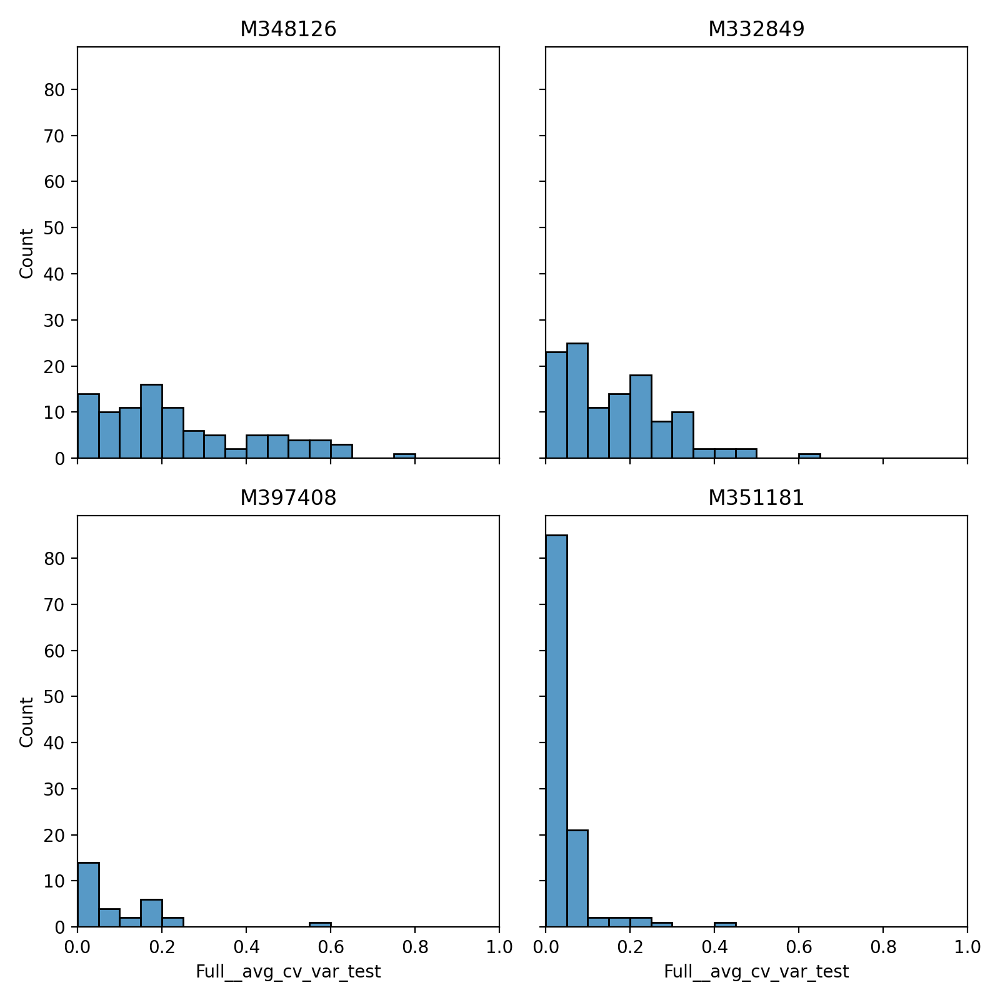

In [29]:
fig, ax = plt.subplots(2,2, figsize=(8,8), sharex=True, sharey=True)
for ii, mouse_id in enumerate(results['mouse_id'].unique()):
    sns.histplot(
        data = results.query('mouse_id == @mouse_id'),
        x = 'Full__avg_cv_var_test',
        ax = ax.flatten()[ii],
        bins = np.arange(0, 1, 0.05)
    )
    ax.flatten()[ii].set_xlim(0,1)
    ax.flatten()[ii].set_title(mouse_id)
fig.tight_layout()

<IPython.core.display.Javascript object>


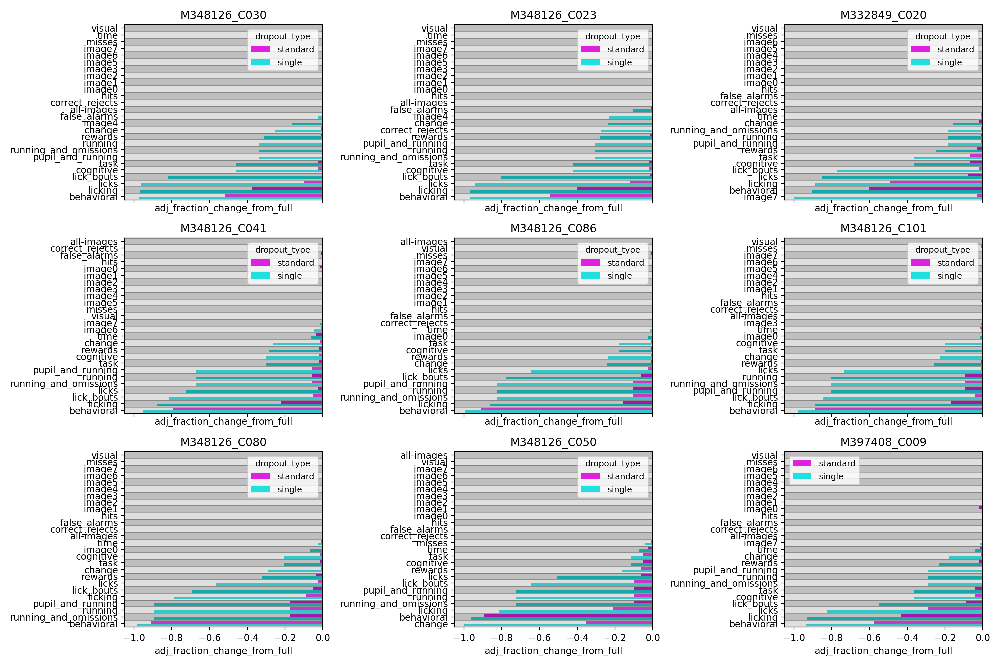

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [30]:
fig, ax = plt.subplots(3,3, figsize=(15,10), sharex=True)
for ii, csid in enumerate(results.iloc[:9].index):
    gvt.plot_dropout_summary(
        dropout_summary,
        cell_specimen_id = csid,
        ax = ax.flatten()[ii],
        ylabel_fontsize=10, 
        ticklabel_fontsize=10, 
        title_fontsize=10, 
        legend_fontsize=9,
    )
    ax.flatten()[ii].set_title(csid)
fig.tight_layout()

In [31]:
def get_dropout_df(cell_id, dropout_summary):
    '''
    gets limited dropout df for this cell
    '''
    dropouts_of_interest = [
        'single-all-images',
        'single-change',
        'single-hits',
        'single-misses',
        'single-false_alarms',
        'single-correct_rejects',
        'single-lick_bouts',
        'single-licks',
        'single-running'
    ]
    dropout_df = dropout_summary.query('cell_specimen_id in @cell_id and dropout in @dropouts_of_interest').set_index('dropout')
    return dropout_df
    

def get_top_dropout(cell_id, dropout_summary):
    '''
    gets the single dropout that explains most variance for this cell
    '''
    
    dropout_df = get_dropout_df(cell_id, dropout_summary)
    top_dropout = dropout_df['variance_explained'].idxmax()
    return top_dropout

In [32]:
def plot_cell(ax, glm, cell_id, t0, t1, legend=True):
    
    df = glm.cell_results_df.query('cell_specimen_id == @cell_id').query('fit_trace_timestamps > @t0 and fit_trace_timestamps < @t1')

    ax.plot(df['fit_trace_timestamps'], df['fit_array'])
    ax.plot(df['fit_trace_timestamps'], df['model_prediction'])

    # plot licks as black dots
    licks = glm.session.licks.query('timestamps > @t0 and timestamps < @t1')
    ax.plot(
        licks['timestamps'],
        np.zeros_like(licks['timestamps']),
        marker = 'o',
        linestyle = 'none',
        color = 'black'
    )

    # plot rewards as blue dots
    rewards = glm.session.rewards.query('timestamps > @t0 and timestamps < @t1')
    ax.plot(
        rewards['timestamps'],
        np.zeros_like(rewards['timestamps']),
        marker = 'o',
        linestyle = 'none',
        color = 'blue'
    )

    # plot changes as vertical lines
    changes = glm.session.stimulus_presentations.query('start_time > @t0 and start_time < @t1 and change')
    for change_time in changes['start_time']:
        ax.axvline(change_time)

    if legend==True:
        ax.legend(['z-scored dff', 'model prediction'])
    ax.set_xlabel('time (s)')

    top_dropout = get_top_dropout(cell_id, dropout_summary)
    ax.set_title('cell_id: {}, var_explained: {:0.4f}\ntop dropout = {}'.format(
        cell_id, 
        glm.results.loc[cell_id]['Full__avg_cv_adjvar_test'],
        top_dropout
    ))

<IPython.core.display.Javascript object>


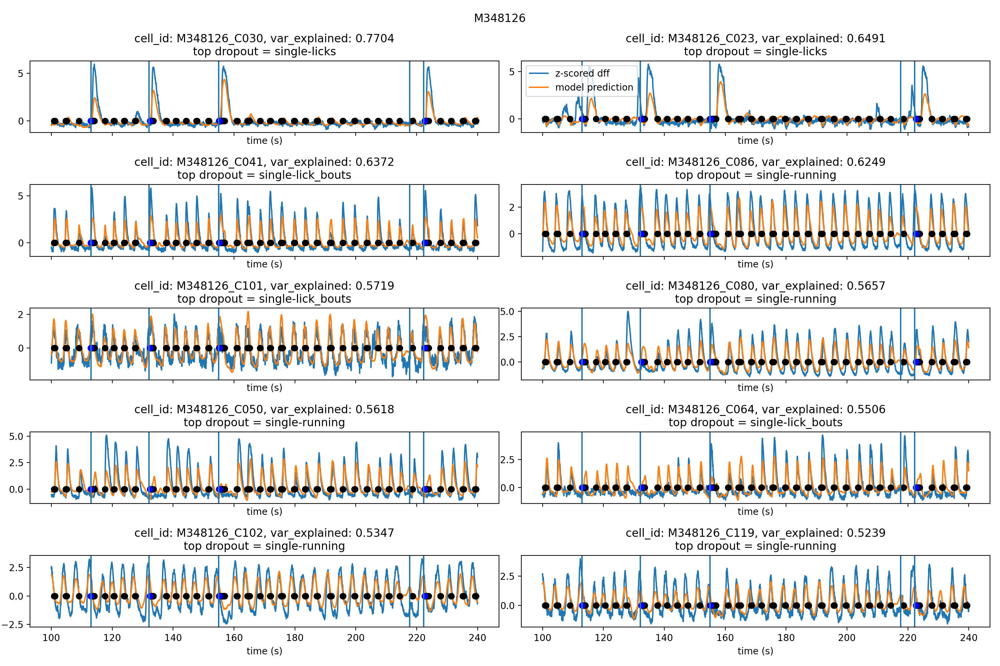

<IPython.core.display.Javascript object>


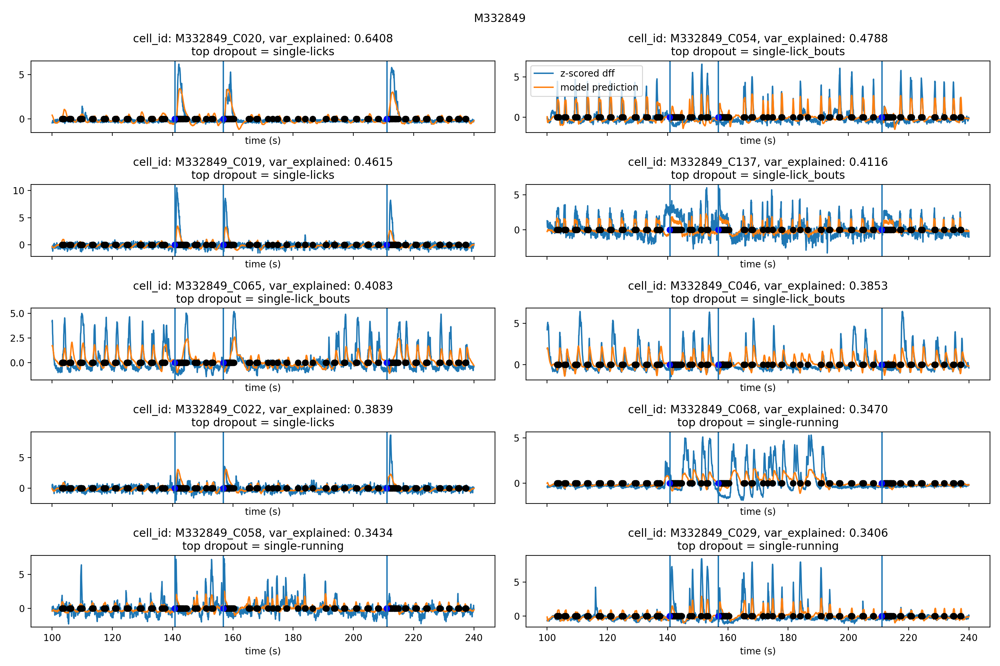

<IPython.core.display.Javascript object>


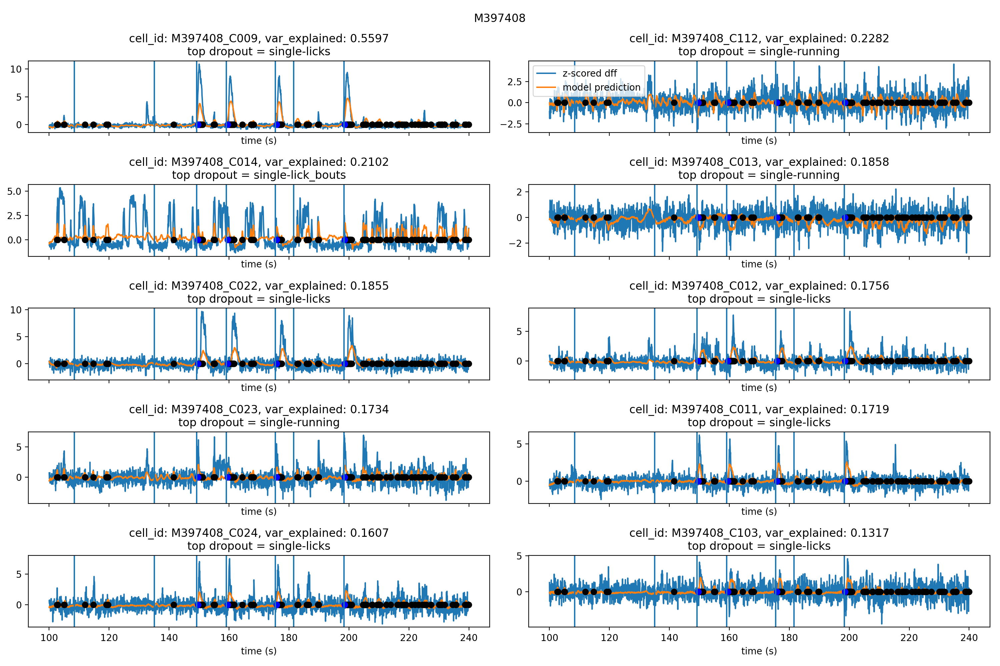

<IPython.core.display.Javascript object>


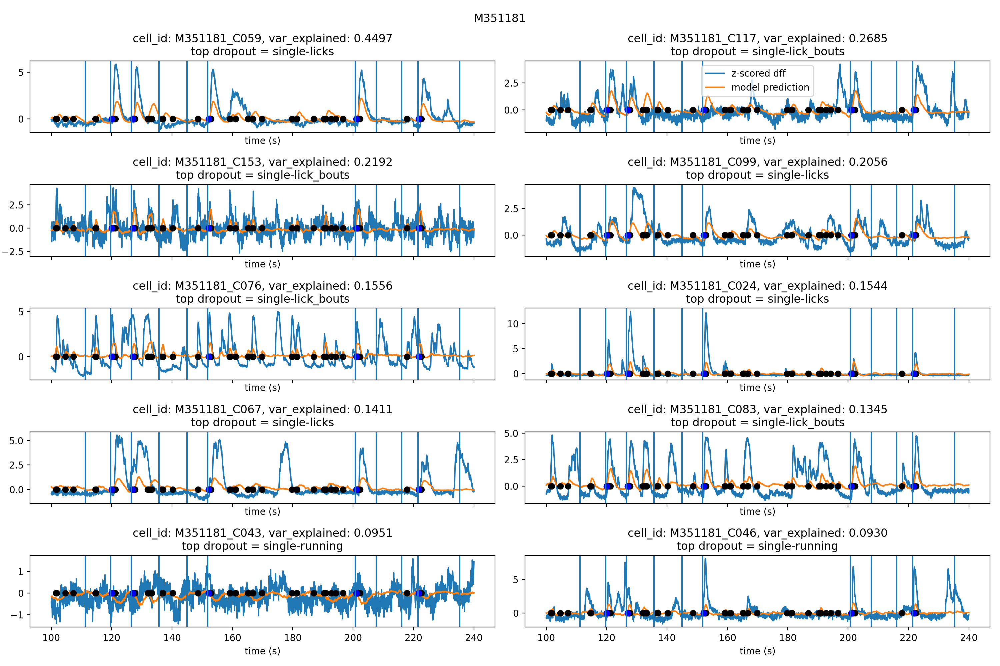

In [33]:
t0 = 100
t1 = 240

for ii, mouse_id in enumerate(results['mouse_id'].unique()): #enumerate(['M348126', 'M332849', 'M397408', 'M351181']): 
    
    glm = glm_dict[mouse_id]
    # look at the top 10 cells for this mouse
    data = glm.results.sort_values(by='Full__avg_cv_var_test', ascending=False).iloc[:10]
    
    fig, ax = plt.subplots(5, 2, figsize = (15,10), sharex=True)
    
    for ii,cell_id in enumerate(data.index):
        legend = True if ii == 1 else False

        plot_cell(ax.flatten()[ii], glm, cell_id, t0, t1, legend=legend)
    
    fig.suptitle(mouse_id)
    fig.tight_layout()
    
    

## I'm curious about one of these cells that had top dropout of 'single-running', but looks like a lick cell

In [34]:
cell_id = 'M348126_C086'
get_dropout_df(cell_id, dropout_summary)

,absolute_change_from_full,variance_explained,variance_explained_full,fraction_change_from_full,cell_specimen_id,adj_fraction_change_from_full,adj_variance_explained,adj_variance_explained_full,cell_roi_id
dropout,,,,,,,,,
single-all-images,-0.624882,0.000000,0.624882,0.000000,M348126_C086,0.000000,0.000000,0.624886,M348126_C086
single-change,-0.596951,0.027931,0.624882,-0.044697,M348126_C086,-0.241802,0.130093,0.538014,M348126_C086
single-correct_rejects,-0.624882,0.000000,0.624882,0.000000,M348126_C086,0.000000,0.000000,0.379876,M348126_C086
single-false_alarms,-0.624882,0.000000,0.624882,0.000000,M348126_C086,0.000000,0.000000,0.564990,M348126_C086
single-hits,-0.624882,0.000000,0.624882,0.000000,M348126_C086,0.000000,0.000000,0.571040,M348126_C086
single-lick_bouts,-0.137941,0.486941,0.624882,-0.779252,M348126_C086,-0.778472,0.489940,0.629361,M348126_C086
single-licks,-0.223461,0.401421,0.624882,-0.642396,M348126_C086,-0.642474,0.404396,0.629435,M348126_C086
single-misses,-0.624882,0.000000,0.624882,0.000000,M348126_C086,0.000000,0.000000,0.145692,M348126_C086
single-running,-0.108789,0.516093,0.624882,-0.825905,M348126_C086,-0.825944,0.516018,0.624761,M348126_C086


<IPython.core.display.Javascript object>


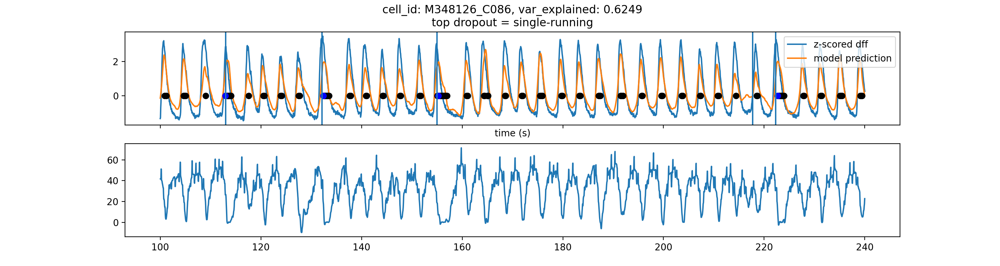

In [35]:
glm = glm_dict['M348126']
    
fig, ax = plt.subplots(2,1, figsize = (15,4), sharex=True)

plot_cell(ax[0], glm, cell_id, t0, t1, legend=True)
running = glm.session.running_speed.query('timestamps >= @t0 and timestamps <= @t1')
ax[1].plot(running['timestamps'], running['speed'])

In [36]:
cell_id = 'M332849_C042'
get_dropout_df(cell_id, dropout_summary)

,absolute_change_from_full,variance_explained,variance_explained_full,fraction_change_from_full,cell_specimen_id,adj_fraction_change_from_full,adj_variance_explained,adj_variance_explained_full,cell_roi_id
dropout,,,,,,,,,
single-all-images,-0.339529,0.000000,0.339529,0.000000,M332849_C042,0.000000,0.000000,0.339917,M332849_C042
single-change,-0.334735,0.004794,0.339529,0.000000,M332849_C042,-0.049765,0.017688,0.355423,M332849_C042
single-correct_rejects,-0.339529,0.000000,0.339529,0.000000,M332849_C042,0.000000,0.000735,0.089799,M332849_C042
single-false_alarms,-0.339527,0.000003,0.339529,0.000000,M332849_C042,0.000000,0.002310,0.000000,M332849_C042
single-hits,-0.339529,0.000000,0.339529,0.000000,M332849_C042,0.000000,0.000000,0.009656,M332849_C042
single-lick_bouts,-0.291937,0.047592,0.339529,-0.140171,M332849_C042,-0.162205,0.056958,0.351147,M332849_C042
single-licks,-0.297520,0.042010,0.339529,-0.123729,M332849_C042,-0.146220,0.051406,0.351565,M332849_C042
single-misses,-0.338733,0.000796,0.339529,0.000000,M332849_C042,-0.014358,0.005600,0.390013,M332849_C042
single-running,-0.000459,0.339070,0.339529,-0.998647,M332849_C042,-0.999055,0.340864,0.341187,M332849_C042


<IPython.core.display.Javascript object>


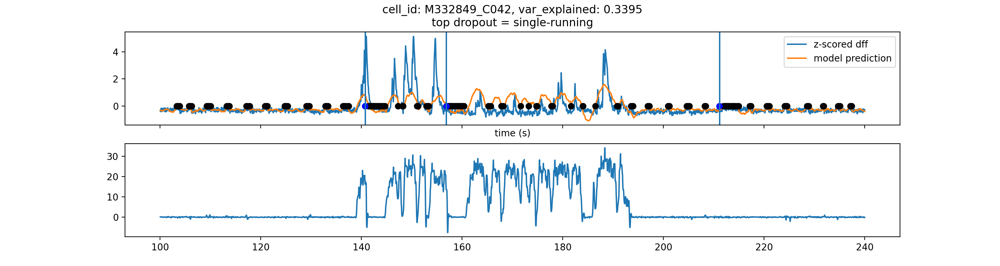

In [37]:
glm = glm_dict['M332849']
    
fig, ax = plt.subplots(2,1, figsize = (15,4), sharex=True)

plot_cell(ax[0], glm, cell_id, t0, t1, legend=True)
running = glm.session.running_speed.query('timestamps >= @t0 and timestamps <= @t1')
ax[1].plot(running['timestamps'], running['speed'])

## I'm also curious about a handful of cells that look like change-driven cells, but are categorized as lick. M348126_C030 is an example

<IPython.core.display.Javascript object>


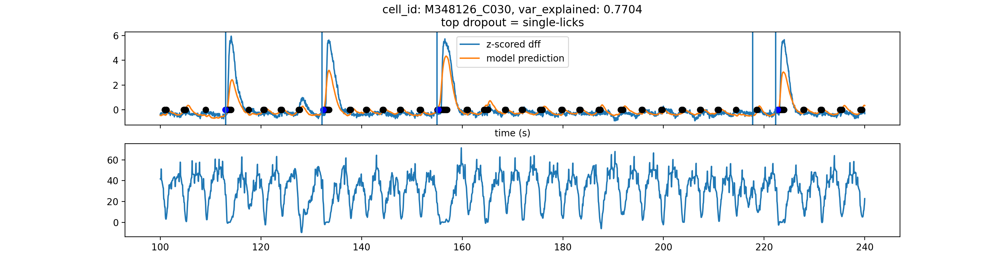

In [45]:
glm = glm_dict['M348126']
cell_id = 'M348126_C030'
    
fig, ax = plt.subplots(2,1, figsize = (15,4), sharex=True)

plot_cell(ax[0], glm, cell_id, t0, t1, legend=True)
running = glm.session.running_speed.query('timestamps >= @t0 and timestamps <= @t1')
ax[1].plot(running['timestamps'], running['speed'])

In [46]:
dir(glm)

['NO_DROPOUTS',
 'TESTING',
 'W',
 'X',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_import_glm_fit_tools',
 'cell_results_df',
 'collect_results',
 'current_model',
 'design',
 'df_dropout',
 'dropout_summary',
 'fit',
 'fit_model',
 'get_cells_above_threshold',
 'gft',
 'kernels',
 'load_fit_model',
 'make_movie',
 'oeid',
 'ophys_experiment_id',
 'ophys_session_id',
 'plot_dropout_summary',
 'plot_filters',
 'results',
 'run_params',
 'session',
 'timestamps',
 'version']

In [47]:
glm.current_model

'Full'

## build a dataframe with rows for single cells, columns for dropouts

In [38]:
dropouts_of_interest = [
        'single-all-images',
        'single-change',
        'single-hits',
        'single-misses',
        'single-false_alarms',
        'single-correct_rejects',
        'single-lick_bouts',
        'single-licks',
        'single-running'
    ]
dropout_summary_simple = dropout_summary.query('dropout in @dropouts_of_interest').pivot(
    index = 'cell_specimen_id',
    columns = 'dropout',
    values = 'variance_explained'
)
dropout_summary_simple.fillna(0).sample(10)

dropout,single-all-images,single-change,single-correct_rejects,single-false_alarms,single-hits,single-lick_bouts,single-licks,single-misses,single-running
cell_specimen_id,,,,,,,,,
M348126_C084,0.000000,0.019942,0.000000,0.000000,0.000000,0.267808,0.228233,0.000180,0.238149
M348126_C025,0.000000,0.006222,0.000028,0.000000,0.000000,0.028166,0.022682,0.000660,0.030731
M351181_C049,0.000000,0.000817,0.001443,0.000000,0.004616,0.000000,0.000000,0.000000,0.031635
M332849_C122,0.000000,0.003334,0.000000,0.000272,0.000000,0.064503,0.049336,0.000000,0.025264
M351181_C128,0.001088,0.000000,0.000000,0.000000,0.000000,0.012806,0.008932,0.000000,0.000000
M332849_C067,0.001599,0.018796,0.000000,0.000000,0.000000,0.293359,0.278383,0.000117,0.045060
M348126_C058,0.000000,0.009517,0.000000,0.000150,0.000000,0.094202,0.079545,0.000000,0.115170
M348126_C088,0.000000,0.010497,0.000019,0.000014,0.000000,0.164754,0.127185,0.000029,0.170939
M348126_C034,0.000000,0.021844,0.000022,0.000000,0.001676,0.105126,0.100114,0.000000,0.145031


## Normalize each row by its max. This will tell is which dropout(s) explain the most variance for a given cell, regardless of the absolute variance explained for that cell

In [39]:
normalized_dropout_df = []
for idx, row in dropout_summary_simple.iterrows():
    normalized_dropout_df.append((row/row.max()))
normalized_dropout_df = pd.DataFrame(normalized_dropout_df).fillna(0)

normalized_dropout_df['mouse_id'] = None
for idx, row in normalized_dropout_df.iterrows():
    normalized_dropout_df.at[idx, 'mouse_id'] = idx.split('_')[0]
    
normalized_dropout_df.sample(10)

dropout,single-all-images,single-change,single-correct_rejects,single-false_alarms,single-hits,single-lick_bouts,single-licks,single-misses,single-running,mouse_id
M332849_C024,0.00000,0.117327,0.000000,0.000000,0.298934,0.789374,1.000000,0.000000,0.875058,M332849
M397408_C009,0.00000,0.244262,0.000000,0.000046,0.000000,0.665901,1.000000,0.000000,0.350776,M397408
M348126_C159,0.00000,0.268855,0.000589,0.000000,0.002255,0.826748,0.870055,0.000000,1.000000,M348126
M332849_C137,0.00919,0.052293,0.000135,0.000000,0.000000,1.000000,0.955441,0.000000,0.632834,M332849
M332849_C050,0.00000,0.039387,0.000000,0.000000,0.000000,0.292632,0.269091,0.006218,1.000000,M332849
M351181_C037,0.00000,0.578189,0.022948,0.000000,0.000000,0.274867,0.568374,0.000000,1.000000,M351181
M351181_C049,0.00000,0.025834,0.045618,0.000000,0.145917,0.000000,0.000000,0.000000,1.000000,M351181
M351181_C015,0.00000,0.000000,0.320863,0.000000,1.000000,0.000000,0.139724,0.000000,0.000000,M351181
M332849_C133,0.00000,0.066077,0.009461,0.000373,0.000000,1.000000,0.945684,0.032214,0.661010,M332849
M348126_C000,0.00000,1.000000,0.005987,0.000000,0.000000,0.000000,0.000000,0.830831,0.000000,M348126


In [40]:
normalized_dropout_df[dropouts_of_interest].describe()

dropout,single-all-images,single-change,single-hits,single-misses,single-false_alarms,single-correct_rejects,single-lick_bouts,single-licks,single-running
count,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000
mean,0.041222,0.150884,0.019494,0.018934,0.001064,0.029377,0.587011,0.596339,0.706239
std,0.164560,0.217710,0.099901,0.113028,0.005411,0.137170,0.382327,0.369246,0.368299
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.036099,0.000000,0.000000,0.000000,0.000000,0.198178,0.231864,0.389639
50%,0.000000,0.075821,0.000000,0.000000,0.000000,0.000000,0.703729,0.682047,0.968260
75%,0.002414,0.163118,0.000000,0.001404,0.000134,0.001431,0.954689,0.961292,1.000000
max,1.000000,1.000000,1.000000,1.000000,0.067253,1.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>


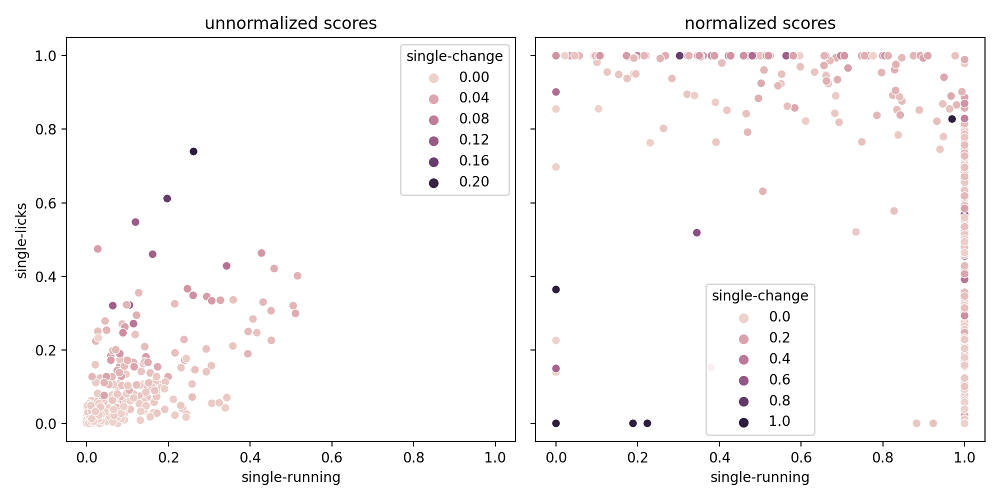

In [41]:
fig, ax = plt.subplots(1,2, figsize = (10,5), sharex=True, sharey=True)
sns.scatterplot(
    data = dropout_summary_simple,
    x = 'single-running',
    y = 'single-licks',
    hue = 'single-change',
    ax = ax[0]
)
sns.scatterplot(
    data = normalized_dropout_df,
    x = 'single-running',
    y = 'single-licks',
    hue = 'single-change',
    ax = ax[1]
)
ax[0].set_title('unnormalized scores')
ax[1].set_title('normalized scores')
fig.tight_layout()

## look at the normalized dropout dataframe in tsne space. Are there clusters?
There aren't clusters. It's more or less continuous. I wonder if these two dimensions are predominantly running and licking? I need to do PCA!!

In [42]:
from sklearn.manifold import TSNE

X = normalized_dropout_df[dropouts_of_interest]
X_embedded = TSNE(n_components=2).fit_transform(X.values)

<ipython-input-43-fa310ebb3fc3>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


<IPython.core.display.Javascript object>


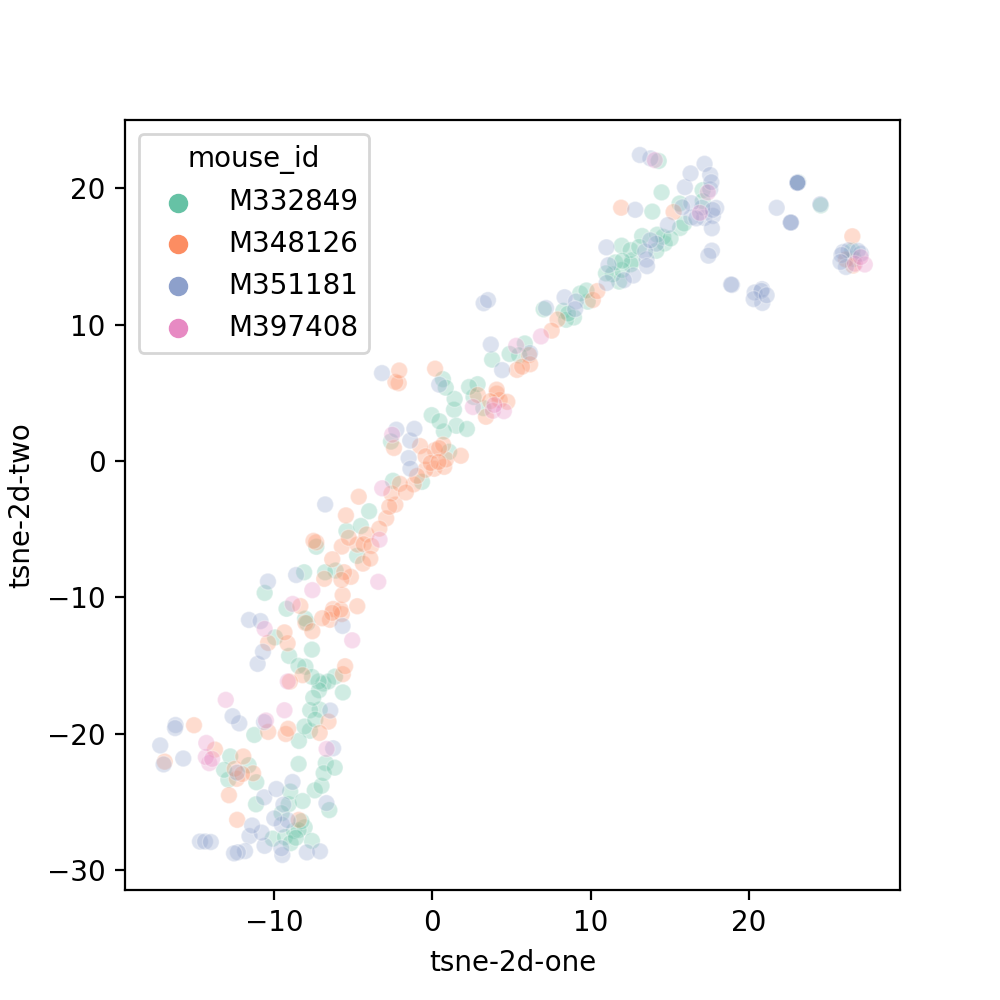

In [43]:
normalized_dropout_df['tsne-2d-one'] = X_embedded[:,0]
normalized_dropout_df['tsne-2d-two'] = X_embedded[:,1]
plt.figure(figsize=(5,5))
ax = sns.scatterplot(
    data=normalized_dropout_df,
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="mouse_id",
    palette='Set2',
    legend="full",
    alpha=0.3
)

<IPython.core.display.Javascript object>


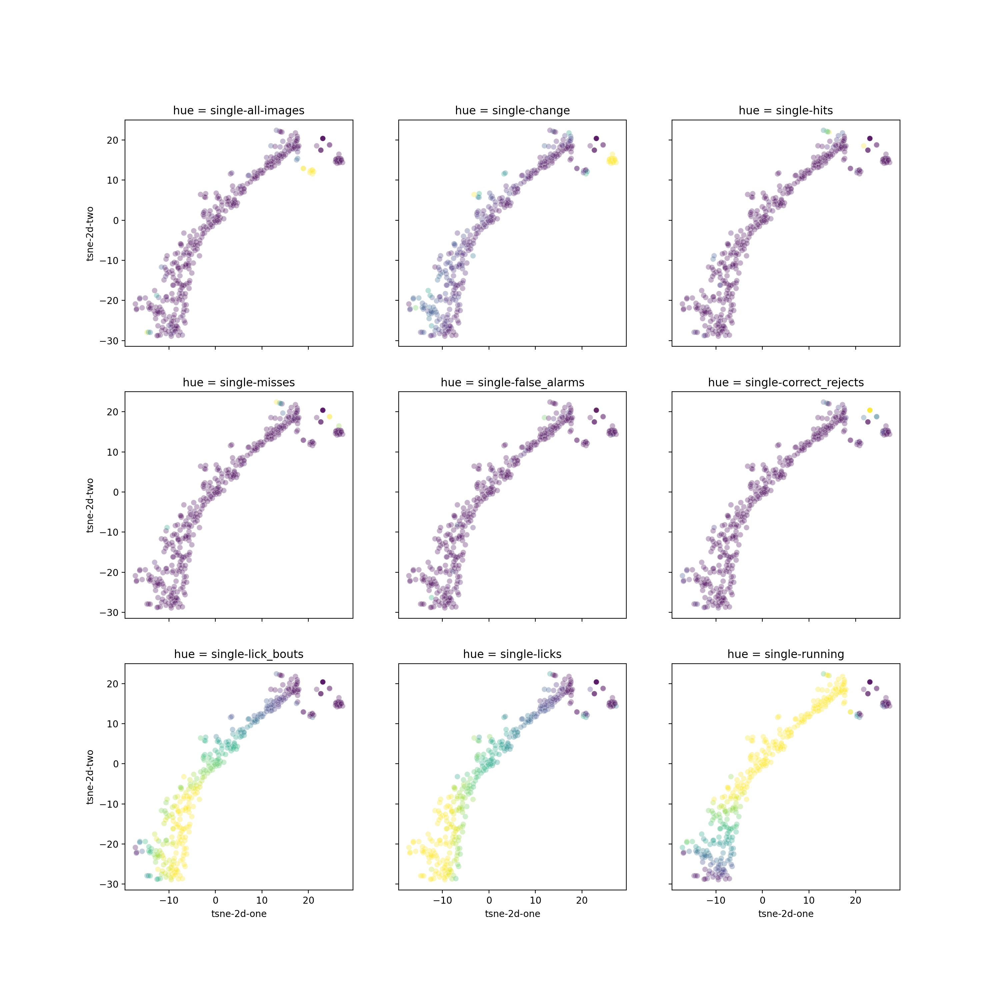

In [44]:
fig, ax = plt.subplots(3,3,figsize = (15,15), sharex = True, sharey = True)

for ii, dropout in enumerate(dropouts_of_interest):
    sns.scatterplot(
        data=normalized_dropout_df,
        x="tsne-2d-one", 
        y="tsne-2d-two",
        hue=dropout,
        palette='viridis',
        legend=False,
        alpha=0.3,
        ax = ax.flatten()[ii]
    )
    ax.flatten()[ii].set_title('hue = {}'.format(dropout))

In [61]:
from functools import cached_property
class Monopoly(object):

    def __init__(self):
        self.boardwalk_price = 500

    @cached_property
    def boardwalk(self):
        # Again, this is a silly example. Don't worry about it, this is
        #   just an example for clarity.
        self.boardwalk_price += 50
        return self.boardwalk_price

In [62]:
monopoly = Monopoly()

In [69]:
monopoly.boardwalk

600

In [70]:
del monopoly.__dict__['boardwalk']

In [8]:
session.stimulus_presentations

,frame,end_frame,start_time,duration,image_category,image_name,orientation,contrast,nearest_lick,change,nearest_F_frame,omitted,image_index,is_change,nearest_ophys_time,time_to_nearest_ophys
0,1,6,22.10592,0.281646,im077,im077,NaN,NaN,10.30839,True,412.0,False,0,True,22.10486,0.00106
1,20,26,22.82307,0.297691,im077,im077,NaN,NaN,9.59124,False,426.0,False,0,False,22.80502,0.01805
2,40,46,23.59068,0.297275,im077,im077,NaN,NaN,8.82363,False,442.0,False,0,False,23.60521,0.01453
3,60,66,24.35813,0.297414,im077,im077,NaN,NaN,8.05618,False,457.0,False,0,False,24.35538,0.00275
4,80,86,25.12506,0.297471,im077,im077,NaN,NaN,7.28925,False,472.0,False,0,False,25.10555,0.01951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4674,92422,92428,3602.16520,0.297527,im062,im062,NaN,NaN,0.93428,False,39559.0,False,4,False,3602.17328,0.00808
4675,92442,92448,3602.93233,0.297732,im062,im062,NaN,NaN,1.70141,False,39574.0,False,4,False,3602.92345,0.00888
4676,92461,92466,3603.68277,0.247973,im062,im062,NaN,NaN,1.61821,False,39589.0,False,4,False,3603.67362,0.00915
4677,92481,92487,3604.43374,0.297097,im062,im062,NaN,NaN,0.86724,False,39604.0,False,4,False,3604.42379,0.00995
